In [2]:
import h5py
import properscoring as ps
import torch.nn as nn
import torch
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import os
from scipy.stats import rankdata
import pandas as pd
import seaborn as sns

In [3]:

folder_name_maybritt = 'full2'
folder_name_benchmarks = "full"
method_name_dict = {
        "maybritt_nicolai_zeros-constant_dec-1e-3_onehot": 'EnScale',
        "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal": 'EnScale-t',
        "nn_det_per_variable": "NN-det",
        "gan": "GAN",
        "analogues": "Analogues",
        "idr": "EasyUQ",
        "corrdiff": "CorrDiff-s",
        "corrdiff_fixed-seeds": "CorrDiff",
        "true": "RCM"
    }
colorblind_palette = sns.color_palette("colorblind")
colors_dict = {
"EnScale": colorblind_palette[0],
"EnScale-t": colorblind_palette[1],
"CorrDiff": colorblind_palette[3],
"CorrDiff-s": colorblind_palette[4],
"GAN": colorblind_palette[6],
"Analogues": colorblind_palette[7],
"EasyUQ": colorblind_palette[8],
"NN-det": colorblind_palette[9],
"RCM": colorblind_palette[2],
}

version_name = "vnewlayers2"
# method_list = ["maybritt_nicolai_zeros-constant_dec-1e-3_onehot", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal", "corrdiff", "corrdiff_fixed-seeds"]
method_list = ["analogues", "gan", "corrdiff", "corrdiff_fixed-seeds", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal",]
method_list_psd = method_list + ["idr", "true", "nn_det_per_variable"]
run_index_img = 0


In [4]:
from eval_metrics_funs import *
from utils import *
from eval_funs import *

Pysteps configuration file found at: /u/mschillinger/my_conda/miniconda3/envs/mlenv/lib/python3.9/site-packages/pysteps/pystepsrc



In [5]:
def correct_units(data, data_type = "tas"):
    if data_type == "pr" and data.mean() < 0.1:
        return data * 86400 # if no normalisation, convert from kg/(m^2s) to mm/day
    elif data_type == "tas" and data.mean() > 100:
        return data - 273.15 # if no normalisation, convert from K to C
    else:
        return data

In [6]:
gcm_list, rcm_list, gcm_dict, rcm_dict = get_rcm_gcm_combinations("/r/scratch/groups/nm/downscaling/cordex-ALPS-allyear")

In [7]:
tuples = list(zip(gcm_list, rcm_list))
print(tuples)

[('CNRM-CM5', 'ALADIN63'), ('MPI-ESM-LR', 'ALADIN63'), ('CNRM-CM5', 'CCLM4-8-17'), ('MIROC5', 'CCLM4-8-17'), ('MPI-ESM-LR', 'CCLM4-8-17'), ('MIROC5', 'REMO2015'), ('CNRM-CM5', 'RegCM4-6'), ('MPI-ESM-LR', 'RegCM4-6')]


In [8]:
for i, (gcm, rcm) in enumerate(tuples):
    print(i, gcm, rcm)

0 CNRM-CM5 ALADIN63
1 MPI-ESM-LR ALADIN63
2 CNRM-CM5 CCLM4-8-17
3 MIROC5 CCLM4-8-17
4 MPI-ESM-LR CCLM4-8-17
5 MIROC5 REMO2015
6 CNRM-CM5 RegCM4-6
7 MPI-ESM-LR RegCM4-6


# Example images

In [40]:
rcm = rcm_list[run_index_img]
gcm = gcm_list[run_index_img]
variables = ["tas", "pr", "sfcWind", "rsds"]
true_data, gen_data = load_data(gcm, rcm, variables, mode="test_interpolation", run_ids=method_list[:1], load_diffusion=False, load_gan=False, load_benchmarks=False)

In [41]:

concatenated_true_data = np.concatenate([true_data[var] for var in variables], axis=2)
concatenated_gen_data = {method: np.concatenate([gen_data[method][var] for var in variables], axis=2) for method in method_list[:1]}

scores = np.stack([cond_energy_score(torch.tensor(true_data[var].copy()), 
                  torch.tensor(gen_data[method_list[0]][var][:,:,:,0].copy()), 
                  torch.tensor(gen_data[method_list[0]][var][:,:,:,1].copy()))[0] for var in variables], axis=-1)

print(scores.shape)
ranks = np.stack([np.argsort(np.argsort(scores[:, i])) for i in range(scores.shape[-1])], axis=-1)
print(ranks.shape)
ranks_avg = np.mean(ranks, axis=-1)
print(ranks_avg.shape)

(3652, 4)
(3652, 4)
(3652,)


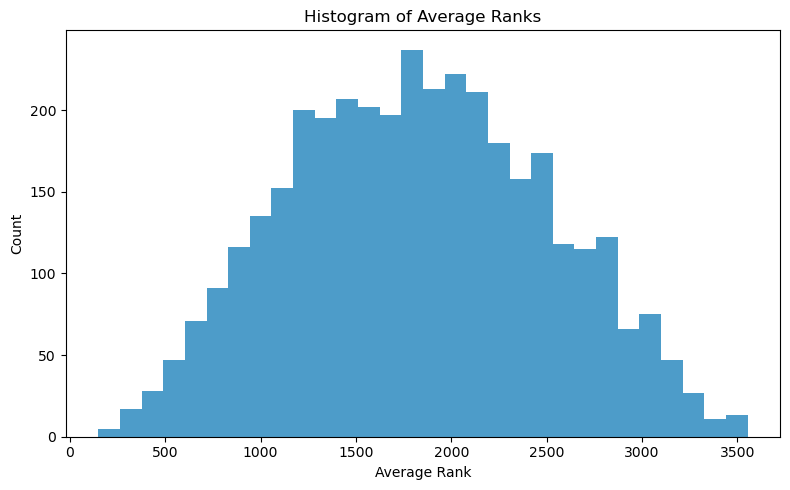

In [49]:
hist, bin_edges = np.histogram(ranks_avg, bins=30)
plt.figure(figsize=(8, 5))
plt.bar(bin_edges[:-1], hist, width=np.diff(bin_edges), align='edge', color=colorblind_palette[0], alpha=0.7)
plt.xlabel("Average Rank")
plt.ylabel("Count")
plt.title("Histogram of Average Ranks")
plt.tight_layout()
plt.show()

In [56]:
p10 = np.percentile(ranks_avg, 10)
p90 = np.percentile(ranks_avg, 90)
p50 = np.percentile(ranks_avg, 50)

indices_10th = np.where(np.isclose(ranks_avg, p10, atol=3))[0]
indices_90th = np.where(np.isclose(ranks_avg, p90, atol=3))[0]
indices_50th = np.where(np.isclose(ranks_avg, p50, atol=3))[0]

print("Indices near 10th percentile:", indices_10th)
print("Indices near 90th percentile:", indices_90th)
print("Indices near 50th percentile:", indices_50th)

Indices near 10th percentile: [ 413 1236 1788 2396 2567 2584 2927 3253 3288]
Indices near 90th percentile: [ 102 1636 1784 2165 2953 3122]
Indices near 50th percentile: [ 703  784  901  941  984 1170 1339 1533 1575 1685 1780 2047 2269 2353
 3053 3057 3151 3420]


In [44]:
selected_data_index = np.where(np.floor(ranks_avg) == len(scores) // 2 - 1) 
selected_data_index

(array([ 389, 1217, 2112]),)

Medium days with new EnScale: 2289, 2375, 660, 1951, 389, 1217, 2112
Good days with new EnScale:  [ 413 1236 1788 2396 2567 2584 2927 3253 3288]
Bad days with new EnScale:   [ 102 1636 1784 2165 2953 3122] 

Old "medium" days: 2297, 1788, 3256 #[932, 1145, 2307, 2297, 1788, 3256]

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
option = "medium"

for option in ["medium", "good", "bad"]:
    if option == "medium":
        # automatic selection - was based on EnScale temporal, but I use the numbers here now as well
        #selected_data_indices = [np.where(np.floor(ranks_avg) == len(scores) // 2)[0][0],
        #                         np.where(np.floor(ranks_avg) == len(scores) // 2 + 1)[0][0],
        #                         np.where(np.floor(ranks_avg) == len(scores) // 2 + 2)[0][0]]
        selected_data_indices = [2289, 2375, 660, 1951, 389, 1217, 2112] #[932, 1145, 2307, 2297, 1788, 3256]

    elif option == "good":
        #selected_data_indices = np.where(np.logical_and(np.floor(ranks_avg) >= len(scores) // 10 - 20, 
        #                                                np.floor(ranks_avg) <= len(scores) // 10 + 20))[0][0:3]
        selected_data_indices = [413, 1236, 1788, 2396, 2567, 2584, 2927, 3253, 3288] # [1099, 749, 426]
    elif option == "bad":
        #selected_data_indices = np.where(np.logical_and(np.floor(ranks_avg) >= len(scores) * 9// 10 - 20, 
        #                                                np.floor(ranks_avg) <= len(scores) * 9 // 10 + 20))[0][0:3]
        selected_data_indices = [102, 1636, 1784, 2165, 2953, 3122]#[1214, 498, 258]

    num_cols = 4
    num_rows = len(variables)
    for k in range(len(selected_data_indices)):
        selected_data_index = selected_data_indices[k]
        print(selected_data_index)

        # Set up gridspec: separate column for the colorbar
        fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
        gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

        units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
        cmap = 'viridis'

        for idx, var in enumerate(variables):
            global_vmin = np.nanmin(true_data[var][selected_data_index])
            global_vmax = np.nanmax(true_data[var][selected_data_index])
            
            if var == "pr" or var == "sfcWind":
                global_vmin = 0
                global_vmax = global_vmax * 0.8

            # Plot true_data for this index (column 0)
            ax = fig.add_subplot(gs[idx, 0])
            im = ax.imshow(true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"RCM", fontsize=16)
            ax.set_ylabel(f'{var}', fontsize=16)
            for spine in ax.spines.values():
                spine.set_visible(False)

            # Plot generated data for this index (columns 1 to 3)
            for s in range(3):
                ax = fig.add_subplot(gs[idx, s + 1])
                ax.imshow(gen_data[method_list[0]][var][selected_data_index, :, :, s], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
                ax.set_title(f"EnScale sample {s+1}", fontsize=16)
                ax.axis('off')

            # Colorbar setup
            cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
            cbar = fig.colorbar(im, cax=cbar_ax)
            cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

        # Remove ticks and labels for all axes
        for ax in fig.get_axes():
            ax.label_outer()
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

        plt.tight_layout()
        plt.savefig(f"figures/enscale_examples_{option}_{selected_data_index}_{version_name}.png")

### Difference plot

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

num_rows = len(variables)
num_cols = 4  # One true example + 3 generations

option = "medium"
selected_data_indices = [2289, 2375, 660, 1951, 389, 1217, 2112]

for k in range(len(selected_data_indices)):
    selected_data_index = selected_data_indices[k]
    print(selected_data_index)

    # Set up gridspec: separate column for the colorbar
    fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
    gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

    units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
    cmap = 'RdBu_r'

    for idx, var in enumerate(variables):
        global_vmin = -np.max(np.abs(gen_data[method_list[0]][var][selected_data_index, :, :, 1] -
                            gen_data[method_list[0]][var][selected_data_index, :, :, 0]))
        global_vmax = np.max(np.abs(gen_data[method_list[0]][var][selected_data_index, :, :, 1] -
                            gen_data[method_list[0]][var][selected_data_index, :, :, 0]))
            
        # Plot true_data for this index (column 0)
        ax = fig.add_subplot(gs[idx, 0])
        im = ax.imshow(gen_data[method_list[0]][var][selected_data_index, :, :, 0] - 
                       true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
        ax.set_title(f"Pred. error", fontsize=16)
        ax.set_ylabel(f'{var}', fontsize=16)
        for spine in ax.spines.values():
            spine.set_visible(False)

        # Plot generated data for this index (columns 1 to 3)
        for s in range(3):
            ax = fig.add_subplot(gs[idx, s + 1])
            im = ax.imshow(gen_data[method_list[0]][var][selected_data_index, :, :, 0] -
                      gen_data[method_list[0]][var][selected_data_index, :, :, s+1], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"EnScale Sample diff.", fontsize=16)
            ax.axis('off')

        # Colorbar setup
        cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

    # Remove ticks and labels for all axes
    for ax in fig.get_axes():
        ax.label_outer()
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    plt.tight_layout()
    plt.savefig(f"figures/enscale_examples_{option}_{selected_data_index}_difference.png")

### Plot benchmarks

In [36]:
rcm = rcm_list[run_index_img]
gcm = gcm_list[run_index_img]
variables = ["tas", "pr", "sfcWind", "rsds"]
true_data, gen_data = load_data(gcm, rcm, variables, mode="test_interpolation", run_ids=method_list[:1], load_diffusion=True, load_gan=True, load_benchmarks=True)

In [ ]:
num_rows = len(variables)
num_cols = 4  # One true example + 3 generations


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
option = "medium"

for method_plot in ["analogues", "gan", "corrdiff"]:
    if option == "medium":
        selected_data_indices = [2289, 2375, 660, 1951, 389, 1217, 2112] 

    for k in range(len(selected_data_indices)):
        selected_data_index = selected_data_indices[k]
        print(selected_data_index)


        # Set up gridspec: separate column for the colorbar
        fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
        gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

        units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
        cmap = 'viridis'

        for idx, var in enumerate(variables):
            global_vmin = np.nanmin(true_data[var][selected_data_index])
            global_vmax = np.nanmax(true_data[var][selected_data_index])
            
            if var == "pr" or var == "sfcWind":
                global_vmin = 0
                global_vmax = global_vmax * 0.8

            # Plot true_data for this index (column 0)
            ax = fig.add_subplot(gs[idx, 0])
            im = ax.imshow(true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"RCM", fontsize=16)
            ax.set_ylabel(f'{var}', fontsize=16)
            for spine in ax.spines.values():
                spine.set_visible(False)

            # Plot generated data for this index (columns 1 to 3)
            for s in range(3):
                ax = fig.add_subplot(gs[idx, s + 1])
                ax.imshow(gen_data[method_plot][var][selected_data_index, :, :, s], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
                ax.set_title(f"{method_name_dict[method_plot]} sample {s+1}", fontsize=16)
                ax.axis('off')

            # Colorbar setup
            cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
            cbar = fig.colorbar(im, cax=cbar_ax)
            cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

        # Remove ticks and labels for all axes
        for ax in fig.get_axes():
            ax.label_outer()
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

        plt.tight_layout()
        plt.savefig(f"figures/{method_plot}_examples_{option}_{selected_data_index}_{version_name}.png")

#### Difference plot analogue

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

num_rows = len(variables)
num_cols = 4  # One true example + 3 generations

method_plot = "analogues"
option = "medium"
selected_data_indices = [2289, 2375, 660, 1951, 389, 1217, 2112] 

for k in range(len(selected_data_indices)):
    selected_data_index = selected_data_indices[k]
    print(selected_data_index)

    # Set up gridspec: separate column for the colorbar
    fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
    gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

    units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
    cmap = 'RdBu_r'

    for idx, var in enumerate(variables):
        global_vmin = -np.max(np.abs(gen_data[method_plot][var][selected_data_index, :, :, 1] -
                            gen_data[method_plot][var][selected_data_index, :, :, 0]))
        global_vmax = np.max(np.abs(gen_data[method_plot][var][selected_data_index, :, :, 1] -
                            gen_data[method_plot][var][selected_data_index, :, :, 0]))

        if var == "pr":
            global_vmin = 0
            global_vmax = global_vmax * 0.95
            
        # Plot true_data for this index (column 0)
        ax = fig.add_subplot(gs[idx, 0])
        im = ax.imshow(gen_data[method_plot][var][selected_data_index, :, :, 0] - 
                       true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
        ax.set_title(f"Pred. error", fontsize=16)
        ax.set_ylabel(f'{var}', fontsize=16)
        for spine in ax.spines.values():
            spine.set_visible(False)

        # Plot generated data for this index (columns 1 to 3)
        for s in range(3):
            ax = fig.add_subplot(gs[idx, s + 1])
            im = ax.imshow(gen_data[method_plot][var][selected_data_index, :, :, 0] -
                      gen_data[method_plot][var][selected_data_index, :, :, s+1], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"Sample diff.", fontsize=16)
            ax.axis('off')

        # Colorbar setup
        cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

    # Remove ticks and labels for all axes
    for ax in fig.get_axes():
        ax.label_outer()
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    plt.tight_layout()
    plt.savefig(f"figures/{method_plot}_examples_{option}_{selected_data_index}_difference.png")

### EnScale for different run index

In [58]:
rcm = rcm_list[5]
gcm = gcm_list[5]
true_data, gen_data = load_data(gcm, rcm, variables, mode="test_interpolation", run_ids=method_list[:1], load_diffusion=False, load_gan=False, load_benchmarks=False)

2289
2375
660
1951
389
1217
2112


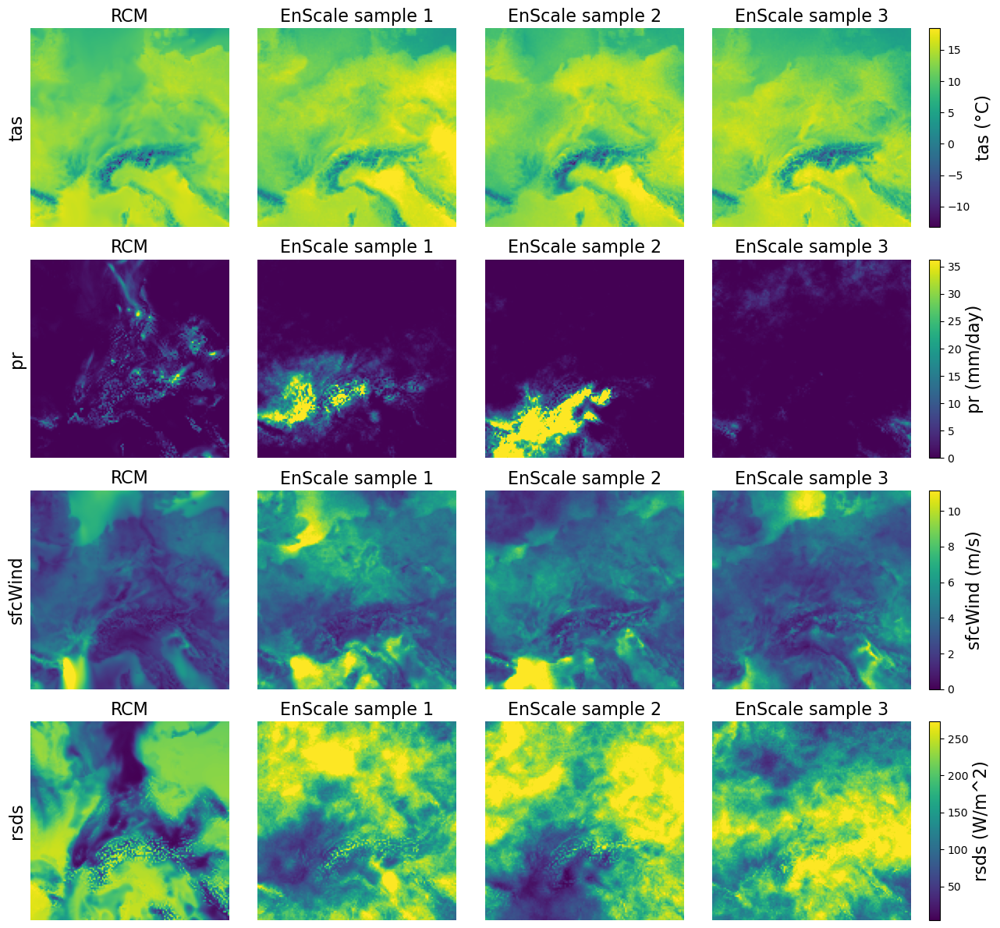

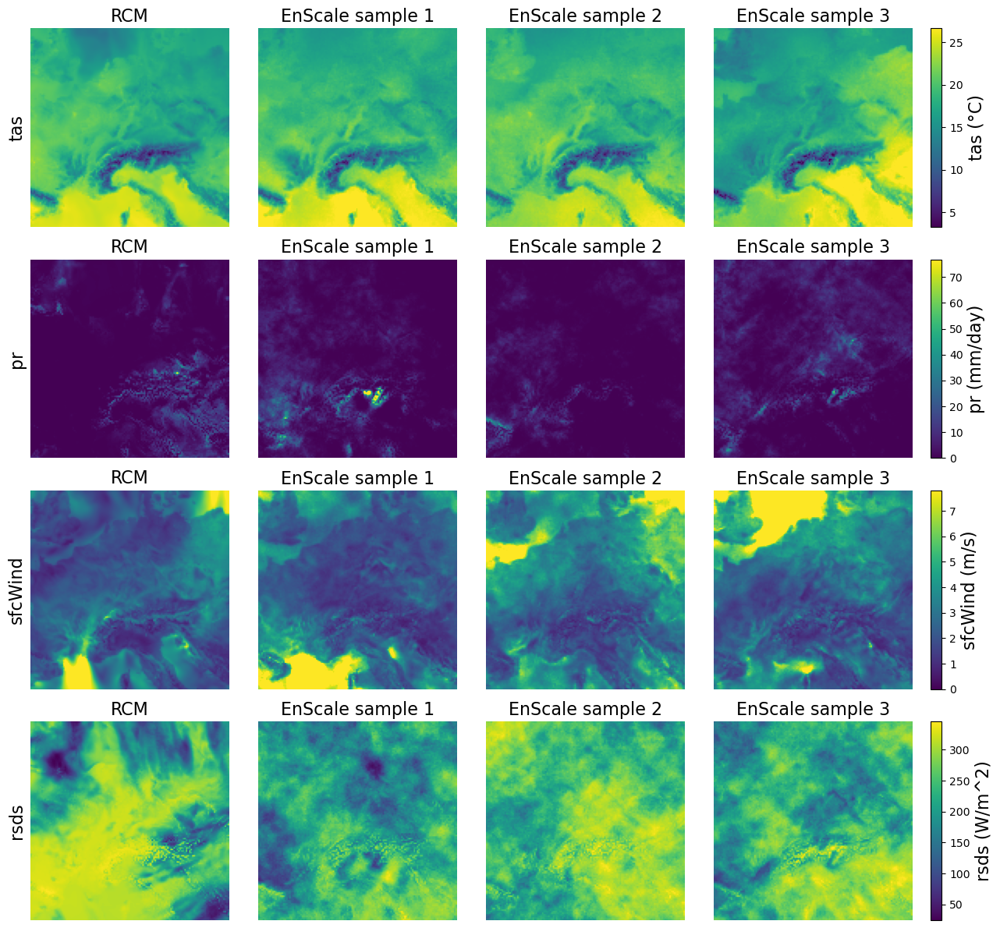

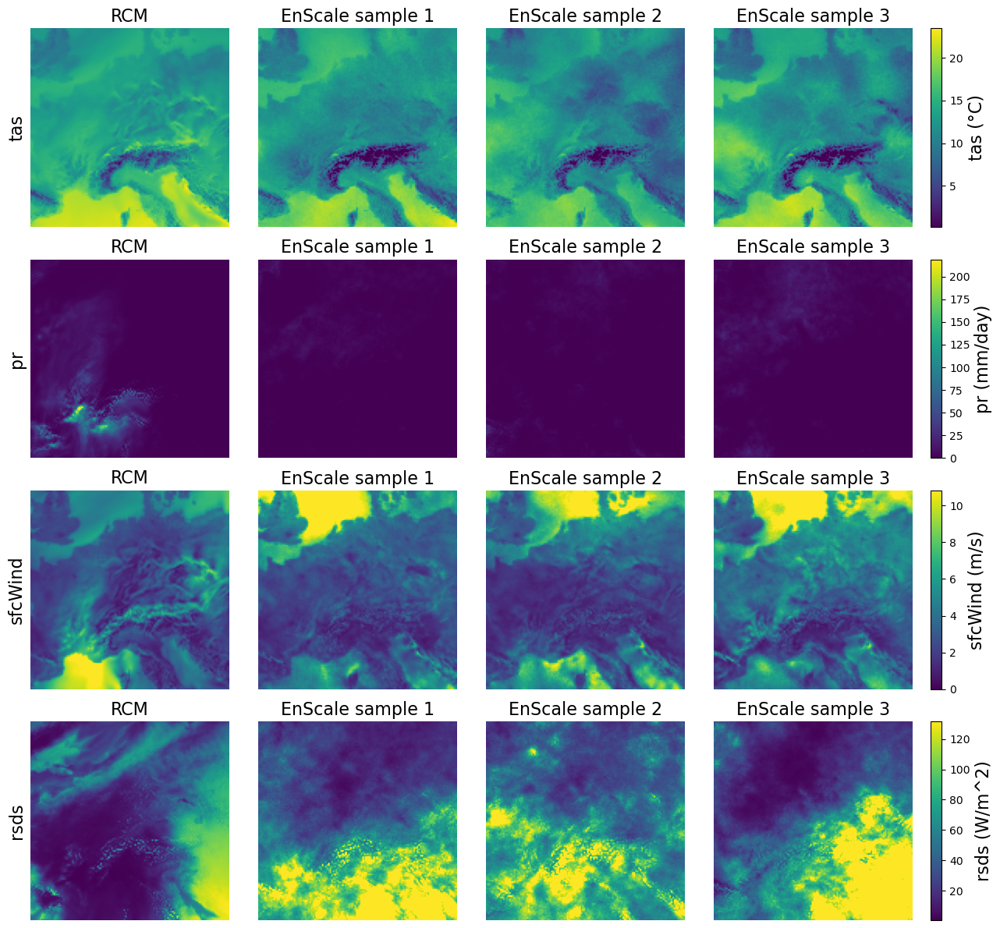

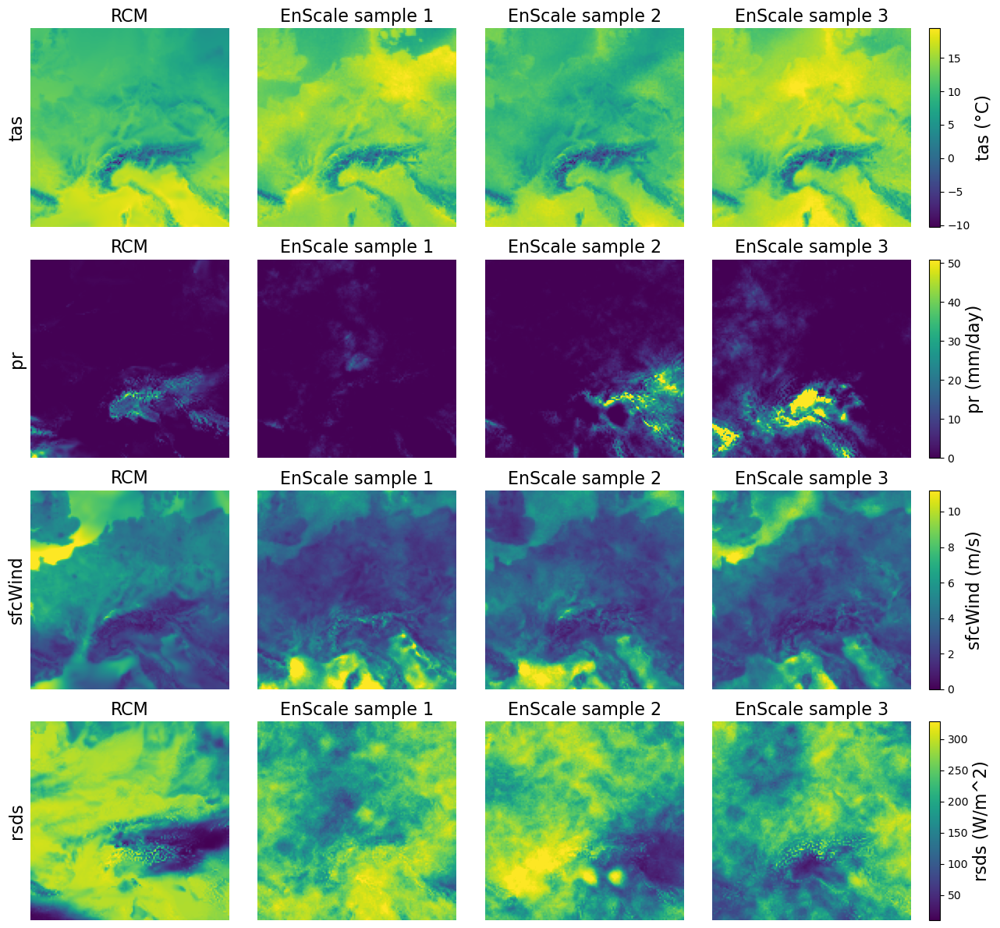

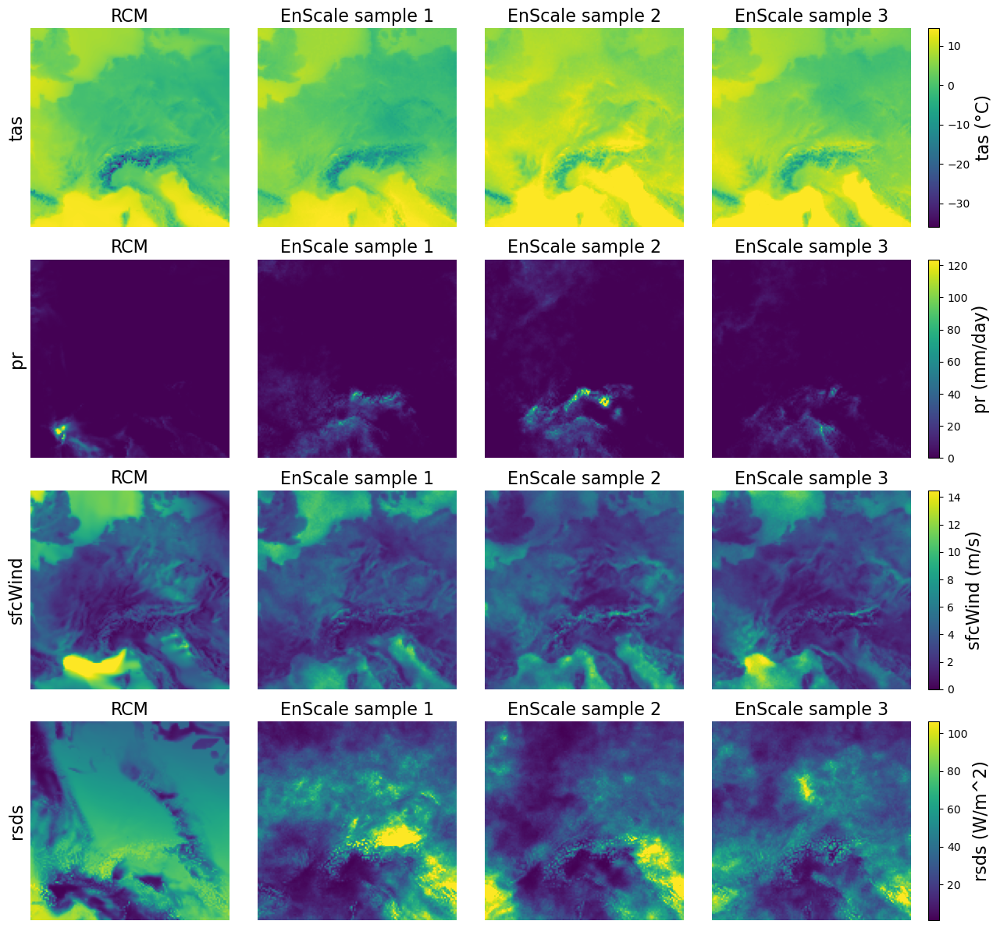

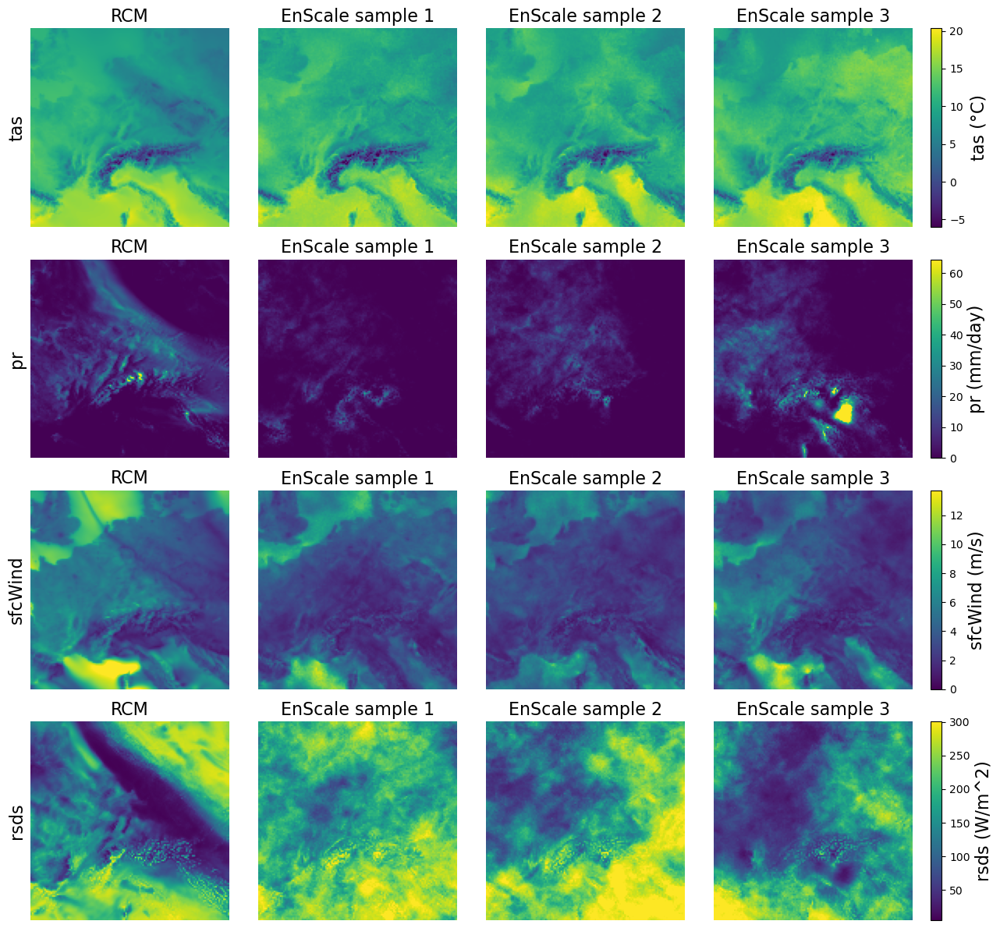

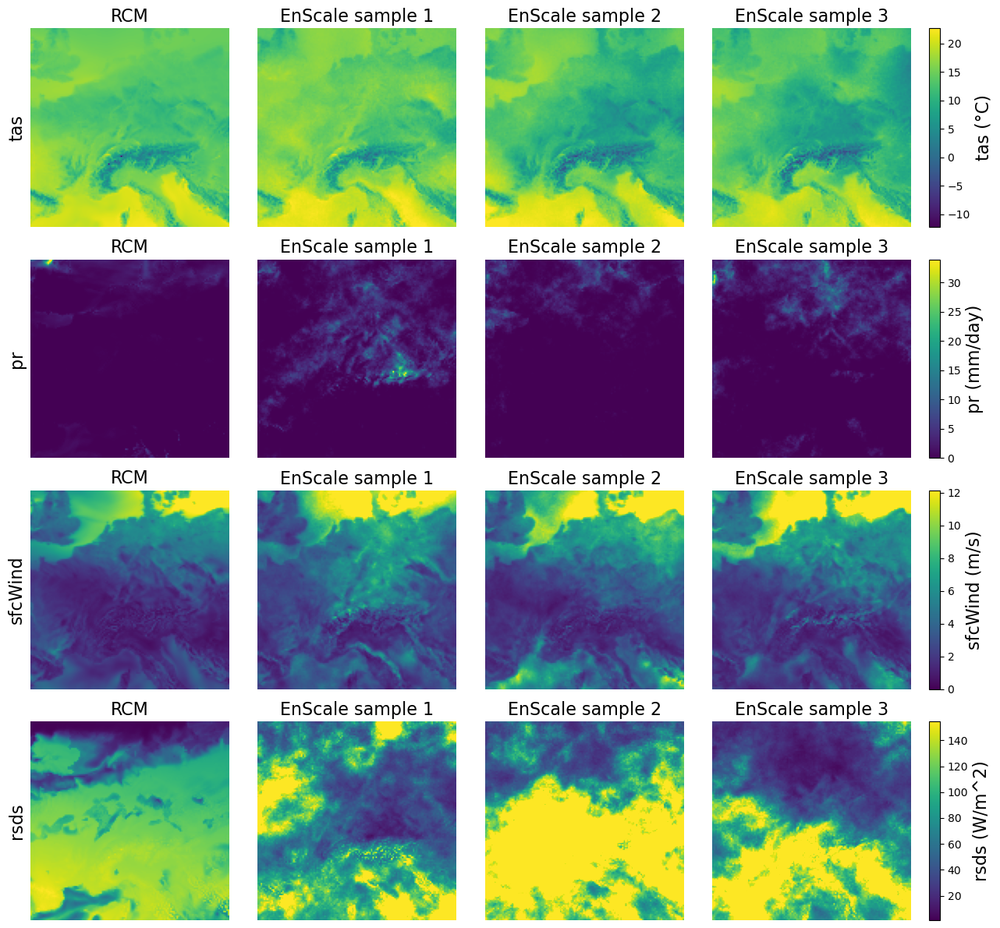

In [59]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
option = "medium"

for option in ["medium"]:
    if option == "medium":
        # automatic selection - was based on EnScale temporal, but I use the numbers here now as well
        #selected_data_indices = [np.where(np.floor(ranks_avg) == len(scores) // 2)[0][0],
        #                         np.where(np.floor(ranks_avg) == len(scores) // 2 + 1)[0][0],
        #                         np.where(np.floor(ranks_avg) == len(scores) // 2 + 2)[0][0]]
        selected_data_indices = [2289, 2375, 660, 1951, 389, 1217, 2112] #[932, 1145, 2307, 2297, 1788, 3256]

    num_cols = 4
    num_rows = len(variables)
    for k in range(len(selected_data_indices)):
        selected_data_index = selected_data_indices[k]
        print(selected_data_index)

        # Set up gridspec: separate column for the colorbar
        fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
        gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

        units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
        cmap = 'viridis'

        for idx, var in enumerate(variables):
            global_vmin = np.nanmin(true_data[var][selected_data_index])
            global_vmax = np.nanmax(true_data[var][selected_data_index])
            
            if var == "pr" or var == "sfcWind":
                global_vmin = 0
                global_vmax = global_vmax * 0.8

            # Plot true_data for this index (column 0)
            ax = fig.add_subplot(gs[idx, 0])
            im = ax.imshow(true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"RCM", fontsize=16)
            ax.set_ylabel(f'{var}', fontsize=16)
            for spine in ax.spines.values():
                spine.set_visible(False)

            # Plot generated data for this index (columns 1 to 3)
            for s in range(3):
                ax = fig.add_subplot(gs[idx, s + 1])
                ax.imshow(gen_data[method_list[0]][var][selected_data_index, :, :, s], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
                ax.set_title(f"EnScale sample {s+1}", fontsize=16)
                ax.axis('off')

            # Colorbar setup
            cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
            cbar = fig.colorbar(im, cax=cbar_ax)
            cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

        # Remove ticks and labels for all axes
        for ax in fig.get_axes():
            ax.label_outer()
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

        plt.tight_layout()
        plt.savefig(f"figures/enscale_examples_{option}_{selected_data_index}_{version_name}_remo.png")

## Pure super model

In [65]:
# idx0_inter_gen-coarse.pt
gcm_list, rcm_list, gcm_dict, rcm_dict = get_rcm_gcm_combinations("/r/scratch/groups/nm/downscaling/cordex-ALPS-allyear")
run_index = 0
run_ids = method_list[:1]
gen_data = {}
name_res = "inter"
variables = ["tas", "pr", "sfcWind", "rsds"]
for run_id in run_ids:
    gen_data[run_id] = {}
    dir_m = f"/r/scratch/groups/nm/downscaling/samples_multivariate/" + run_id
    # idx0_inter
    data = torch.load(f"{dir_m}/idx{run_index}_{name_res}_gen-pure-super.pt")
    var_order = ["tas", "pr", "sfcWind", "rsds"]
    for var in variables:
        data_var = data[:, var_order.index(var), :, :]
        gen_data[run_id][var] = data_var.view(-1, 128, 128, 9).numpy()

In [66]:
gen_data[run_id][var].shape 

(3652, 128, 128, 9)

In [67]:
root = "/r/scratch/groups/nm/downscaling/cordex-ALPS-allyear"
dir_test_int = "/r/scratch/groups/nm/downscaling/cordex-ALPS-allyear/test/" + "interpolation"
mode = "test_interpolation"
gcm = gcm_list[run_index]
rcm = rcm_list[run_index]
true_data = {}
for var in variables:
    if mode == "test_interpolation":
        hr_data = np.flip(xr.open_dataset(os.path.join(dir_test_int, f"{var}_day_EUR-11_{rcm}_{gcm}_r1i1p1_rcp85_ALPS_cordexgrid_2030-2039.nc"))[var].data, 1)
    elif mode == "test_extrapolation":
        hr_data = np.flip(xr.open_dataset(os.path.join(dir_test_int, f"{var}_day_EUR-11_{rcm}_{gcm}_r1i1p1_rcp85_ALPS_cordexgrid_2090-2099.nc"))[var].data, 1)
    true_data[var] = correct_units(hr_data, var)

1951


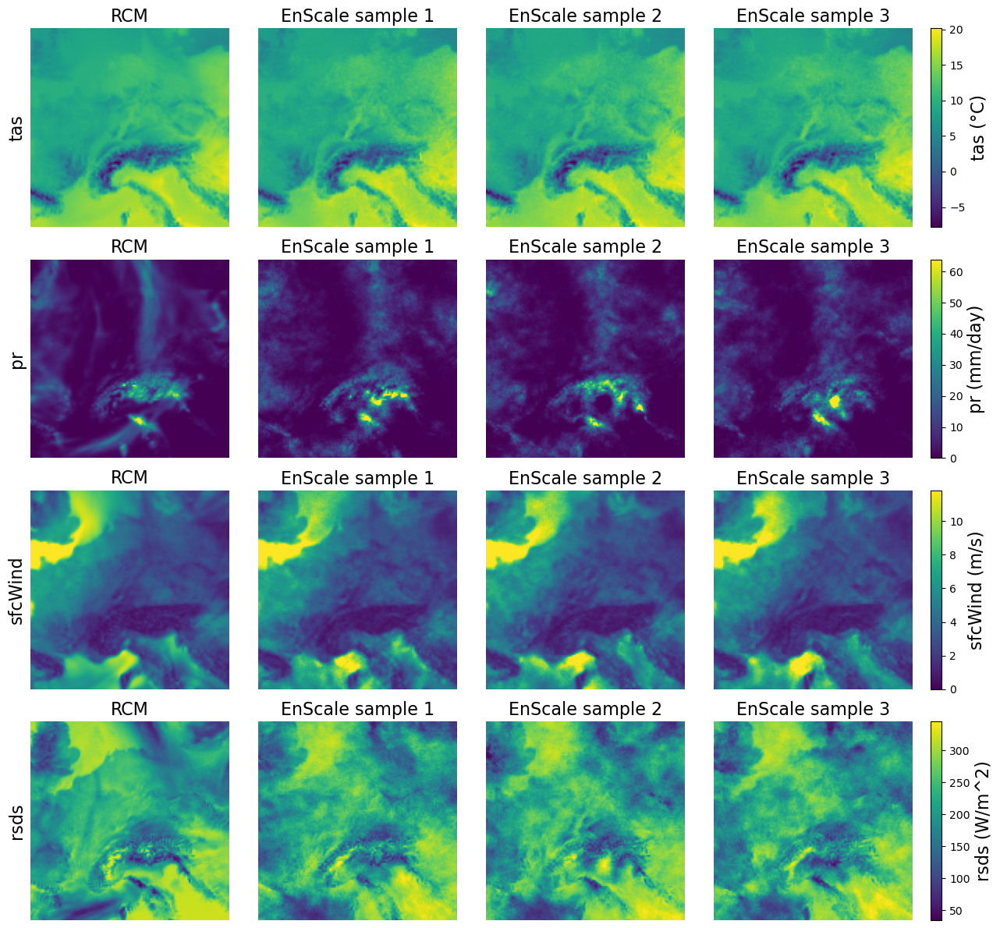

In [68]:
num_rows = len(variables)
num_cols = 4  # One true example + 3 generations

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

method_plot = method_list[0]
selected_data_indices = [1951]

for k in range(len(selected_data_indices)):
    selected_data_index = selected_data_indices[k]
    print(selected_data_index)


    # Set up gridspec: separate column for the colorbar
    fig = plt.figure(figsize=(3*num_cols + 1, 3*num_rows))
    gs = gridspec.GridSpec(num_rows, num_cols + 1, width_ratios=[1, 1, 1, 1, 0.05])  # Add the colorbar column

    units_dict = {"tas": "°C", "pr": "mm/day", "sfcWind": "m/s", "rsds": "W/m^2"}
    cmap = 'viridis'

    for idx, var in enumerate(variables):
        global_vmin = np.nanmin(true_data[var][selected_data_index])
        global_vmax = np.nanmax(true_data[var][selected_data_index])
        
        if var == "pr" or var == "sfcWind":
            global_vmin = 0
            global_vmax = global_vmax * 0.8

        # Plot true_data for this index (column 0)
        ax = fig.add_subplot(gs[idx, 0])
        im = ax.imshow(true_data[var][selected_data_index], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
        ax.set_title(f"RCM", fontsize=16)
        ax.set_ylabel(f'{var}', fontsize=16)
        for spine in ax.spines.values():
            spine.set_visible(False)

        # Plot generated data for this index (columns 1 to 3)
        for s in range(3):
            ax = fig.add_subplot(gs[idx, s + 1])
            ax.imshow(gen_data[method_plot][var][selected_data_index, :, :, s], cmap=cmap, vmin=global_vmin, vmax=global_vmax)
            ax.set_title(f"{method_name_dict[method_plot]} sample {s+1}", fontsize=16)
            ax.axis('off')

        # Colorbar setup
        cbar_ax = fig.add_subplot(gs[idx, -1])  # Colorbar in the last column
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label(f"{var} ({units_dict[var]})", fontsize=16)

    # Remove ticks and labels for all axes
    for ax in fig.get_axes():
        ax.label_outer()
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    plt.tight_layout()
    plt.savefig(f"figures/enscale_examples_puresuper{selected_data_index}_viridis.png")

# Rank histograms from pre-computed histograms

In [9]:
len_lists = {}
for i in range(len(gcm_list)):
    rcm = rcm_list[i]
    gcm = gcm_list[i]
    true_data, gen_data = load_data(gcm, rcm, mode="test_interpolation", run_ids=[],
                                    load_diffusion=False, load_gan=False, load_benchmarks=False, variables=["tas"])
    print(true_data["tas"].shape)
    len_lists[(gcm, rcm)] = true_data["tas"].shape[0]

(3652, 128, 128)
(3652, 128, 128)
(3652, 128, 128)
(3650, 128, 128)
(3652, 128, 128)
(3650, 128, 128)
(3652, 128, 128)
(3652, 128, 128)


In [10]:
len_lists

{('CNRM-CM5', 'ALADIN63'): 3652,
 ('MPI-ESM-LR', 'ALADIN63'): 3652,
 ('CNRM-CM5', 'CCLM4-8-17'): 3652,
 ('MIROC5', 'CCLM4-8-17'): 3650,
 ('MPI-ESM-LR', 'CCLM4-8-17'): 3652,
 ('MIROC5', 'REMO2015'): 3650,
 ('CNRM-CM5', 'RegCM4-6'): 3652,
 ('MPI-ESM-LR', 'RegCM4-6'): 3652}

In [11]:
period = "2030-2039"
methods = method_list
hists_sp_mean = {}
hists_sp_max = {}
n_runs = 8
total_length = 0
for method in methods:
    hists_sp_mean[method] = {}
    hists_sp_max[method] = {}
for i in range(len(gcm_list[:n_runs])):
    selected_rcm = rcm_list[i]
    selected_gcm = gcm_list[i]
    print(selected_gcm, selected_rcm)
    total_length += len_lists[(selected_gcm, selected_rcm)]
    for method in methods:
        if method in ["corrdiff", "corrdiff_fixed-seeds", "analogues", "gan"]:
            folder = f"benchmarks/interpolation/{folder_name_benchmarks}"
        else:
            folder = f"maybritt/interpolation/{folder_name_maybritt}"
        for var in ["tas", "pr", "sfcWind", "rsds"]:
            if i == 0:
                hists_sp_mean[method][var] = np.load(os.path.join("output_evals", folder, var, f"8_{var}_{selected_gcm}_{selected_rcm}_{period}_{method}_rh_sp_mean.npy")) * len_lists[(selected_gcm, selected_rcm)]
                hists_sp_max[method][var] = np.load(os.path.join("output_evals", folder, var, f"8_{var}_{selected_gcm}_{selected_rcm}_{period}_{method}_rh_sp_max.npy")) * len_lists[(selected_gcm, selected_rcm)]
            else:
                hist = np.load(os.path.join("output_evals", folder, var, f"8_{var}_{selected_gcm}_{selected_rcm}_{period}_{method}_rh_sp_mean.npy")) * len_lists[(selected_gcm, selected_rcm)]
                hists_sp_mean[method][var] += hist
                hist_max = np.load(os.path.join("output_evals", folder, var, f"8_{var}_{selected_gcm}_{selected_rcm}_{period}_{method}_rh_sp_max.npy")) * len_lists[(selected_gcm, selected_rcm)]
                # concatenate if needed
                if hist_max.shape[0] < hist.shape[0]:
                    hist_max = np.concatenate([hist_max, np.zeros((hist.shape[0] - hist_max.shape[0]))], axis=0)
                hists_sp_max[method][var] += hist_max

# divide by total number of samples to get the relative frequency
for method in methods:
    for var in ["tas", "pr", "sfcWind", "rsds"]:
        hists_sp_mean[method][var] = hists_sp_mean[method][var] / total_length
        hists_sp_max[method][var] = hists_sp_max[method][var] / total_length

CNRM-CM5 ALADIN63
MPI-ESM-LR ALADIN63
CNRM-CM5 CCLM4-8-17
MIROC5 CCLM4-8-17
MPI-ESM-LR CCLM4-8-17
MIROC5 REMO2015
CNRM-CM5 RegCM4-6
MPI-ESM-LR RegCM4-6


In [12]:
df_per_var = {}
for var in ['tas', 'pr', 'sfcWind', 'rsds']:
    if folder_name_maybritt is not None:
        df = pd.read_csv(f"output_evals/maybritt/interpolation/{folder_name_maybritt}/{var}/concatenated_results_2030-2039_multiple-methods_2378111217.csv")
    if folder_name_benchmarks is not None:
        df_bench = pd.read_csv(f"output_evals/benchmarks/interpolation/{folder_name_benchmarks}/{var}/concatenated_results_2030-2039_maybritt_3step_dense-conv_v3_2378111217.csv")
    
    if folder_name_maybritt is not None and folder_name_benchmarks is not None:
        df = pd.concat([df, df_bench])
    elif folder_name_benchmarks is not None:
        df = df_bench
    
    df_rh = df
    # For columns present in df_rh, drop them from df and replace with values from df_rh (by 'method')
    common_cols = [col for col in df.columns if col in df_rh.columns and col != 'method']
    if common_cols:
        df = df.drop(columns=common_cols)
        df = df.merge(df_rh, on='method', how='left')    
    df = df.set_index('method').loc[method_list].reset_index()
    df_per_var[var] = df


In [13]:
def plot_rank_histograms(version="per_variable", methods=None, version_name=""):
    import seaborn as sns
    import matplotlib.pyplot as plt

    variables = ["tas", "pr", "sfcWind", "rsds"]
    fig, axs = plt.subplots(2, len(variables), figsize=(6 * len(variables), 10), gridspec_kw={'wspace': 0.1})
    plt.rcParams.update({'font.size': 16})


    num_samples = 9
    num_ranks = num_samples + 1
    # Optionally compute average MCB over all variables
    if version == "average":
        avg_mcb_dict = {}
        for method_key, method_name in method_name_dict.items():
            vals = []
            for var in variables:
                try:
                    val = df_per_var[var]['loc_avg_mcb'][df_per_var[var]['method'] == method_key].values[0]
                    vals.append(val)
                except IndexError:
                    continue
            if vals:
                avg_mcb_dict[method_name] = f" | Avg. MCB: {np.mean(vals):.2f}"
        
        print(avg_mcb_dict)

    for i, var in enumerate(variables):
        if version == "per_variable":
            print(methods)
            print([method_name_dict[method] for method in methods ])
            mcb_dict = {
                method_name_dict[method]: f" | Loc.-avg. MCB: {df_per_var[var]['loc_avg_mcb'][df_per_var[var]['method'] == method].values[0]:.2f}"
                for method in methods
            }

        
        for j in range(2):  # j=0: mean, j=1: max
            for method in methods:
                label_text = method_name_dict[method]
                if version == "per_variable":
                    label_text += mcb_dict[method_name_dict[method]]
                elif version == "average" and j == 1 and i == 0:
                    label_text += avg_mcb_dict.get(method_name_dict[method], "")
                    print(label_text)
                else:
                    label_text = None  # suppress repeated legend entries

                data = hists_sp_mean if j == 0 else hists_sp_max
                axs[j, i].step(range(1, num_ranks + 1), data[method][var],
                               label=label_text,
                               where="mid", alpha=0.6, linewidth=2.5,
                               color=colors_dict[method_name_dict[method]])
            if version == "average":
                axs[j, i].hlines(y=1 / (num_samples + 1), xmin=0.5, xmax=num_ranks + 0.5,
                                linestyles='dashed', linewidth=2.5, color=colorblind_palette[2],
                                label='Uniform distribution' if (j == 1 and i == 0) else None)
            else:
                axs[j, i].hlines(y=1 / (num_samples + 1), xmin=0.5, xmax=num_ranks + 0.5,
                                linestyles='dashed', linewidth=2.5, color=colorblind_palette[2],
                                label='Uniform distribution' if (j == 1) else None)
            axs[j, i].set_ylim(0, 3 / (num_samples + 1))
            axs[j, i].set_xlim(0, num_ranks + 0.5)
            axs[j, i].set_xticks([1, 3, 5, 7, 9])
            axs[j, i].set_xlabel('Rank' if j == 1 else '')
            axs[j, i].set_ylabel('Occurrence ratio' if i == 0 else '')
            axs[j, i].set_title(f'{var}' if j == 0 else '')
            if i > 0:
                axs[j, i].set_yticklabels([])

    # Add shared y-axis labels
    fig.text(0.07, 0.70, 'Spatial Mean', va='center', ha='right', fontsize=18, rotation=90, fontweight='bold')
    fig.text(0.07, 0.27, 'Spatial Max', va='center', ha='right', fontsize=18, rotation=90, fontweight='bold')

    # Add legend
    if version == "average":
        axs[1, 0].legend(loc='center', bbox_to_anchor=(1, -0.5), ncol=2)
    else:  # version == "per_variable"
        for i in range(len(variables)):
            axs[1, i].legend(loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=1, fontsize=16)


    plt.tight_layout()
    fname = f"figures/rh_joint_colorblind_mcb-{version}_v{version_name}.png"
    plt.savefig(fname, bbox_inches='tight')
    print(f"Saved: {fname}")


# Version 1: Per-variable MCB in legend
#plot_rank_histograms(version="per_variable", methods=["corrdiff_fixed-seeds", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal",], version_name=version_name + "_reduced")

# Version 2: One legend with averaged MCB
# plot_rank_histograms(version="average")

['corrdiff', 'corrdiff_fixed-seeds', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal']
['CorrDiff-s', 'CorrDiff', 'EnScale', 'EnScale-t']
['corrdiff', 'corrdiff_fixed-seeds', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal']
['CorrDiff-s', 'CorrDiff', 'EnScale', 'EnScale-t']
['corrdiff', 'corrdiff_fixed-seeds', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal']
['CorrDiff-s', 'CorrDiff', 'EnScale', 'EnScale-t']
['corrdiff', 'corrdiff_fixed-seeds', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot', 'maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal']
['CorrDiff-s', 'CorrDiff', 'EnScale', 'EnScale-t']


/tmp/ipykernel_822272/3602825223.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: figures/rh_joint_colorblind_mcb-per_variable_vvnewlayers2_corrdiff-comparison.png


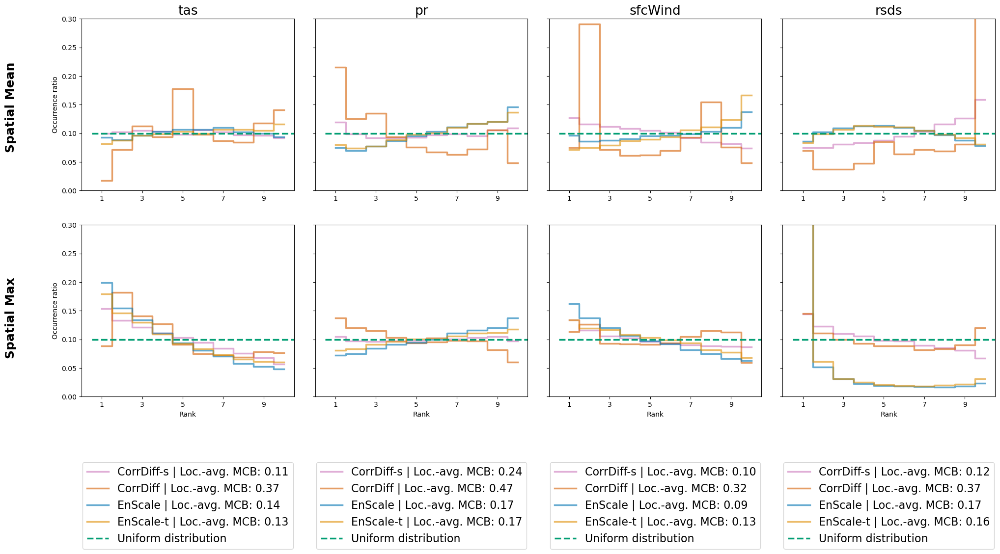

In [14]:
plot_rank_histograms(version="per_variable", methods= (method_list[2:]), version_name=version_name + "_corrdiff-comparison")

In [15]:
def plot_rank_histograms_4row(version="per_variable", methods=None, version_name=""):
    import seaborn as sns
    from collections import OrderedDict
    from matplotlib.legend import Legend
    import matplotlib.pyplot as plt

    # Split methods into two groups
    enscale_methods = [m for m in methods if "EnScale" in method_name_dict[m]]
    benchmark_methods = [m for m in methods if "EnScale" not in method_name_dict[m]]

    variables = ["tas", "pr", "sfcWind", "rsds"]
    # Now 4 rows: (2 stats × 2 groups)
    fig, axs = plt.subplots(4, len(variables), figsize=(6 * len(variables), 20),
                            gridspec_kw={'wspace': 0.1, 'hspace': 0.4})
    plt.rcParams.update({'font.size': 16})

    num_samples = 9
    num_ranks = num_samples + 1

    if version == "average":
        avg_mcb_dict = {}
        for method_key, method_name in method_name_dict.items():
            vals = []
            for var in variables:
                try:
                    val = df_per_var[var]['loc_avg_mcb'][df_per_var[var]['method'] == method_key].values[0]
                    vals.append(val)
                except IndexError:
                    continue
            if vals:
                avg_mcb_dict[method_name] = f" | Avg. MCB: {np.mean(vals):.2f}"

    # Loop: first stats (mean/max), then groups
    for i, var in enumerate(variables):
        for j, stat_name in enumerate(["Spatial Mean", "Spatial Max"]):  # j=0 mean, j=1 max
            data = hists_sp_mean if j == 0 else hists_sp_max

            for g, (group_name, group_methods) in enumerate(
                [("EnScale", enscale_methods), ("Benchmarks", benchmark_methods)]
            ):
                row = j * 2 + g  # reorder rows: mean rows first, then max
                ax = axs[row, i]

                if version == "per_variable":
                    mcb_dict = {
                        method_name_dict[method]: f" | Loc.-avg. MCB: {df_per_var[var]['loc_avg_mcb'][df_per_var[var]['method'] == method].values[0]:.2f}"
                        for method in group_methods
                    }

                for method in group_methods:
                    label_text = method_name_dict[method]
                    if version == "per_variable":
                        label_text += mcb_dict[method_name_dict[method]]
                    elif version == "average" and j == 1 and i == 0:
                        label_text += avg_mcb_dict.get(method_name_dict[method], "")
                    else:
                        label_text = None  # suppress repeats

                    ax.step(range(1, num_ranks + 1), data[method][var],
                            label=label_text,
                            where="mid", alpha=0.6, linewidth=2.5,
                            color=colors_dict[method_name_dict[method]])

                ax.hlines(y=1 / (num_samples + 1), xmin=0.5, xmax=num_ranks + 0.5,
                          linestyles='dashed', linewidth=2.5, color=colorblind_palette[2],
                          label='Uniform distribution' if (j == 1 and g == 0) else None)

                ax.set_ylim(0, 3 / (num_samples + 1))
                ax.set_xlim(0, num_ranks + 0.5)
                ax.set_xticks([1, 3, 5, 7, 9])
                ax.set_xlabel('Rank' if j == 1 else '')
                ax.set_ylabel('Occurrence ratio' if i == 0 else '')
                if j == 0:
                    ax.set_title(f'{var}')
                if i > 0:
                    ax.set_yticklabels([])

        # Helper to remove duplicate labels while preserving order
    def dedup(handles, labels):
        seen = OrderedDict()
        for h, l in zip(handles, labels):
            if (l is None) or (l == ""):
                continue
            if l not in seen:
                seen[l] = h
        return list(seen.values()), list(seen.keys())

    # Shared y-axis labels
    fig.text(0.07, 0.83, 'Spatial Mean – EnScale', va='center', ha='right',
             fontsize=18, rotation=90, fontweight='bold')
    fig.text(0.07, 0.61, 'Spatial Mean – Benchmarks', va='center', ha='right',
             fontsize=18, rotation=90, fontweight='bold')
    fig.text(0.07, 0.38, 'Spatial Max – EnScale', va='center', ha='right',
             fontsize=18, rotation=90, fontweight='bold')
    fig.text(0.07, 0.16, 'Spatial Max – Benchmarks', va='center', ha='right',
             fontsize=18, rotation=90, fontweight='bold')

    # Create two small legends per column (EnScale left, Benchmarks right)
    # We place them relative to the bottom axis of each column (axs[3, i]).
    for i in range(len(variables)):
        handles_e, labels_e = axs[2, i].get_legend_handles_labels()  # EnScale (row 2)
        handles_b, labels_b = axs[3, i].get_legend_handles_labels()  # Benchmarks (row 3)

        handles_e, labels_e = dedup(handles_e, labels_e)
        handles_b, labels_b = dedup(handles_b, labels_b)

        # If no handles, skip
        if not handles_e and not handles_b:
            continue

        # First legend (EnScale) — add as an artist so we can keep a second legend on the same axis
        if handles_e:
            leg_e = axs[3, i].legend(handles_e, labels_e,
                                     loc='upper center',
                                     bbox_to_anchor=(0.4, -0.35),
                                     ncol=1, fontsize=16, frameon=True, title="EnScale")
            fig.add_artist(leg_e)

        # Second legend (Benchmarks) — standard legend (will not replace the previously added artist)
        if handles_b:
            axs[3, i].legend(handles_b, labels_b,
                             loc='upper center',
                             bbox_to_anchor=(0.4, -0.85),
                             ncol=1, fontsize=16, frameon=True, title="Benchmarks")


    plt.tight_layout()
    fname = f"figures/rh_joint_colorblind_mcb-{version}_v{version_name}.png"
    plt.savefig(fname, bbox_inches='tight')
    print(f"Saved: {fname}")


/tmp/ipykernel_822272/4141300840.py:127: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: figures/rh_joint_colorblind_mcb-per_variable_vvnewlayers2_4rows.png


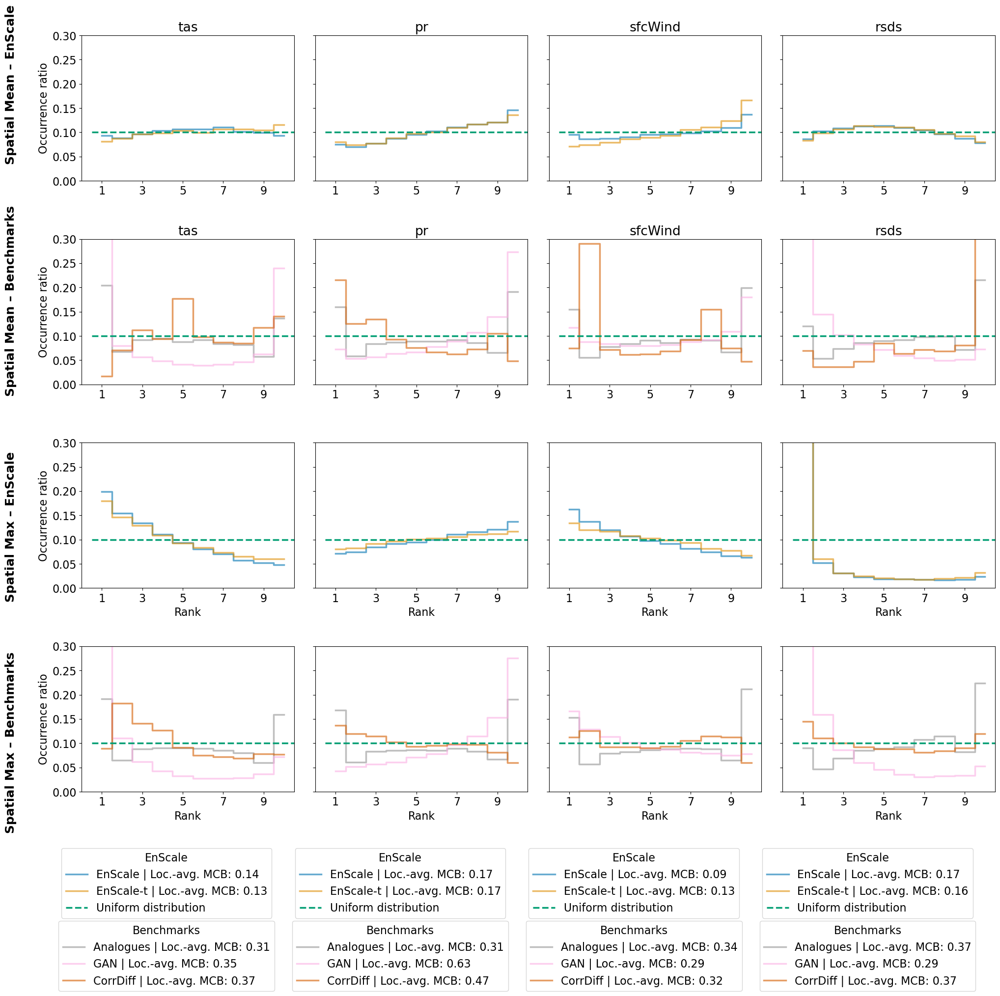

In [16]:
plot_rank_histograms_4row(version="per_variable", methods= ["analogues", "gan", "corrdiff_fixed-seeds", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal"],
    version_name=version_name + "_4rows")

# PSDs

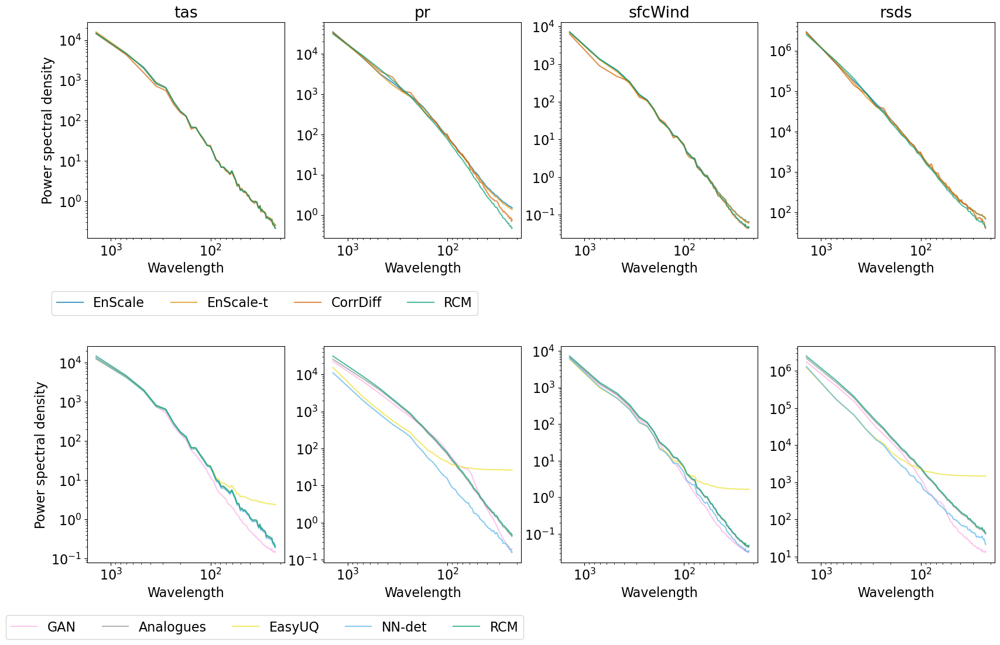

In [17]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Configuration

variables = ["tas", "pr", "sfcWind", "rsds"]

index_prefix = "12"
gcm = "CNRM-CM5"
rcm = "ALADIN63"
period = "2030-2039"

# Plotting
fig, axs = plt.subplots(2, 4, figsize=(20, 12), gridspec_kw={'wspace': 0.2, 'hspace': 0.5})

for col, var in enumerate(variables):    
    # Assign axes for first and second row
    ax_top = axs[0, col]
    ax_bottom = axs[1, col]

    # First row: corrdiff*, maybritt* methods
    for method in ["maybritt_nicolai_zeros-constant_dec-1e-3_onehot", "maybritt_nicolai_zeros-constant_dec-1e-3_onehot_temporal", "corrdiff_fixed-seeds", "true"]:
        if method in ["corrdiff", "corrdiff_fixed-seeds"]:
            folder = f"output_evals/benchmarks/interpolation/{folder_name_benchmarks}"
        else:
            folder = f"output_evals/maybritt/interpolation/{folder_name_maybritt}"
        folder = os.path.join(folder, var)
        if method != "true":
            filename = f"{index_prefix}_{var}_{gcm}_{rcm}_{period}_{method}_gen_psd.npy"
        else:
            filename = f"{index_prefix}_{var}_{gcm}_{rcm}_{period}_{method}_psd.npy"
        path = os.path.join(folder, filename)
        if os.path.exists(path):
            psd = np.load(path)
            n = 128
            radial_freqs = np.arange(n // 2)
            pixel_size_km = 11.0
            wavenumbers = radial_freqs / (n * pixel_size_km)
            wavelengths = 1 / (wavenumbers + 1e-10)
            ax_top.plot(wavelengths[1:], psd[1:], label=method_name_dict[method], color=colors_dict[method_name_dict[method]], alpha=0.7)
        else:
            print(f"Warning: File not found: {path}")

    # Second row: gan, analogues, idr, nn_det_per_variable
    for method in ["gan", "analogues", "idr", "nn_det_per_variable", "true"]:
        folder = f"output_evals/benchmarks/interpolation/{folder_name_benchmarks}"
        folder = os.path.join(folder, var)
        if method != "true":
            filename = f"{index_prefix}_{var}_{gcm}_{rcm}_{period}_{method}_gen_psd.npy"
        else:
            filename = f"{index_prefix}_{var}_{gcm}_{rcm}_{period}_{method}_psd.npy"
        path = os.path.join(folder, filename)
        if os.path.exists(path):
            psd = np.load(path)
            n = 128
            radial_freqs = np.arange(n // 2)
            pixel_size_km = 11.0
            wavenumbers = radial_freqs / (n * pixel_size_km)
            wavelengths = 1 / (wavenumbers + 1e-10)
            ax_bottom.plot(wavelengths[1:], psd[1:], label=method_name_dict[method], color=colors_dict[method_name_dict[method]], alpha=0.7)
        else:
            print(f"Warning: File not found: {path}")

    # Formatting for both rows
    ax_top.set_title(var)
    ax_top.set_xscale("log")
    ax_top.invert_xaxis()
    ax_top.set_yscale("log")
    ax_top.set_xlabel("Wavelength")
    if col == 0:
        ax_top.set_ylabel("Power spectral density")

    ax_bottom.set_xscale("log")
    ax_bottom.invert_xaxis()
    ax_bottom.set_yscale("log")
    ax_bottom.set_xlabel("Wavelength")
    if col == 0:
        ax_bottom.set_ylabel("Power spectral density")

# Final touches
axs[1, 0].legend(loc='center', bbox_to_anchor=(0.9, -0.3), ncol=5)  # Position legend below the plots
axs[0, 0].legend(loc='center', bbox_to_anchor=(0.9, -0.3), ncol=5)  # Position legend below the plots
#plt.tight_layout()
plt.savefig(f"figures/psd_joint_twopanel{version_name}.png", bbox_inches='tight')
plt.show()
